##### Copyright 2024 Google LLC.

In [13]:
# @title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Get started with Video generation using Veo and REST API

<font color='red'>Veo is a paid only feature. It won't run with the Free Tier.  
Running all examples in this notebook costs over **5$** (cf. [pricing](https://ai.google.dev/pricing#veo2) for more details).</font>

In [40]:
%%bash
# Uncomment the next line if you want to run the colab
# touch I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab

[Veo](https://ai.google.dev/gemini-api/docs/models#veo-2) is our most capable video generation model, designed for high-quality video generation across a wide range of industries and use cases. Targeting creative professionals, marketers, advertisers, and everyday consumers alike, Veo empowers users to create photorealistic videos with incredible detail and far fewer distracting artifacts than our previous models. It generates videos in resolutions up to 720p, opening up new possibilities for storytelling, social sharing, advertising, and more.

## Why Veo?
* **Highest quality text-to-video model**: Veo generates photorealistic videos with incredible detail, minimal artifacts, and extended durations in resolutions up to 720p.
* **Advanced language understanding**: Veo deeply understands natural language and visual semantics, capturing the nuance and tone of complex prompts to render intricate details in extended scenes, including cinematic terms like "timelapse" or "aerial shots."
* **Unprecedented creative control**: Veo provides an unprecedented level of creative control, understanding prompts for all kinds of cinematic effects, like timelapses or aerial shots of a landscape.

## Setup

In [15]:
from google.colab import userdata
import os

os.environ['GOOGLE_API_KEY'] = userdata.get('GOOGLE_API_KEY')
os.environ['BASE_URL']="https://generativelanguage.googleapis.com/v1beta"

Install `jq` so we can process the JSON results.

In [16]:
%%bash

# Install jq for JSON processing
sudo apt install -q jq

Reading package lists...
Building dependency tree...
Reading state information...
jq is already the newest version (1.6-2.1ubuntu3).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.


## Text-to-video

Veo is able to generate videos from text prompts (see in the code comments for ideas).

### Prompting Tips for Veo
To get the most out of Veo, consider incorporating specific video terminology into your prompts  Veo understands a wide range of terms related to:

* **Shot composition**: Specify the framing and number of subjects in the shot (e.g., "*single shot*", "*two shot*", "*over-the-shoulder shot*").
* **Camera positioning and movement**:  Control the camera's location and movement using terms like "*eye level*", "*high angle*", "*worms eye*", "*dolly shot*", "*zoom shot*", "*pan shot," and "*tracking shot*".
* **Focus and lens effects**:  Use terms like "*shallow focus*", "*deep focus*", "*soft focus*", "*macro lens*", and "*wide-angle lens*" to achieve specific visual effects.
* **Overall style and subject**: Guide Veo's creative direction by specifying styles like "*sci-fi*", "*romantic comedy*", "*action movie*" or "*animation*". You can also describe the subjects and backgrounds you want, such as "*cityscape*", "*nature*", "*vehicles*", or "animals."

Check the [Veo prompt guide](https://ai.google.dev/gemini-api/docs/video/veo-prompt-guide) for more details and tips.

### Optional parameters
The prompt is the only mandatory parameters, the others are all optional.

* **negativePrompt**: What you don't want to see in the video
* **personGeneration**: Tell you model if it's allowed to generate adults in the videos or not. Children are always blocked.
* **aspectRatio**: Aspect ratio of the video. Accepted values are "16:9" (landscape) and "9:16" (portrait).
* **sampleCount**: Number of videos generated (1 to 2).
* **durationSeconds**: The duration of the video in seconds (5 to 8)

### Start the generation

Video generation uses the `predictLongRunning` method:


In [17]:
%%bash

if [[ -e "I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab" ]]; then

  # Use curl to send a POST request to the predictLongRunning endpoint
  # The request body includes the prompt for video generation
  curl "${BASE_URL}/models/veo-2.0-generate-001:predictLongRunning?key=${GOOGLE_API_KEY}" \
    -H "Content-Type: application/json" \
    -X "POST" \
    -d '{
      "instances": [{
          "prompt": "A captivating aerial drone shot of the Notre dame, during fireworks showcasing the majestic cathedral from a unique perspective. The camera slowly pans around the structure, revealing its intricate details and grandeur."
        }
      ],
      "parameters": {
        "aspectRatio": "16:9",
        "negativePrompt": "cars",
        "personGeneration": "allow_adult",
        "sampleCount": 1,
        "durationSeconds": 8
      }
    }' | tee result.json | jq .name | sed 's/"//g' > op_name

else
  echo "Veo is a paid feature. Please change the variable 'I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab' to True if you are okay with paying to run it."
fi

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   551    0    68  100   483     81    582 --:--:-- --:--:-- --:--:--   664


Have a look at the output:

In [18]:
%%bash
cat result.json

{
  "name": "models/veo-2.0-generate-001/operations/jsnsy0m5o7bw"
}


In [19]:
%%bash
cat op_name

models/veo-2.0-generate-001/operations/jsnsy0m5o7bw


### Check the status

The op-name tells you where to check the status of the video generation. It initially contains nothing, or just the op name.

In [20]:
%%bash

# Check the status of the video generation using the operation name
curl "${BASE_URL}/${op_name}?key=${GOOGLE_API_KEY}" \
  -H "Content-Type: application/json" \
  -X "GET"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0


### Wait for generation to finish

When generation finished it will contain a response field.

In [21]:
%%bash

# Wait for the video generation to finish
# Poll the API every 5 seconds until the response contains a 'response' field

# Retrieve the operation name from the file
op_name=$(cat op_name)

STATUS="null"

while [[ $STATUS == "null" ]]
do
  sleep 5

  # Store the entire response in a temporary file
  curl "${BASE_URL}/${op_name}?key=${GOOGLE_API_KEY}" \
    -H "Content-Type: application/json" \
    -X "GET" > temp_response.json

  # Extract the response field to response.json
  jq '.response' temp_response.json > response.json

  # Read the status correctly using jq with the -r flag
  STATUS=$(jq -r '.' response.json)

  # Optional: print status for debugging
  echo "Current status: $STATUS"
done

Current status: null
Current status: null
Current status: null
Current status: null
Current status: null
Current status: null
Current status: null
Current status: {
  "@type": "type.googleapis.com/google.ai.generativelanguage.v1beta.PredictLongRunningResponse",
  "generateVideoResponse": {
    "generatedSamples": [
      {
        "video": {
          "uri": "https://generativelanguage.googleapis.com/v1beta/files/mlyskbdjcm6s:download?alt=media"
        }
      },
      {
        "video": {
          "uri": "https://generativelanguage.googleapis.com/v1beta/files/9y5tg08ch6ll:download?alt=media"
        }
      }
    ]
  }
}


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0    143      0 --:--:-- --:--:-- --:--:--   144
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0     77      0 --:--:-- --:--:-- --:--:--    77
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0     76      0 --:--:-- --:--:-- --:--:--    76
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0    152      0 --:--:-- --:--:-- --:--:--   152
  % Total    % Received % Xferd  Average Speed   Tim

Check the reponse then extract the uri.

In [22]:
%%bash

# Pretty print the response json for readability (Optional)
jq '' -r response.json

{
  "@type": "type.googleapis.com/google.ai.generativelanguage.v1beta.PredictLongRunningResponse",
  "generateVideoResponse": {
    "generatedSamples": [
      {
        "video": {
          "uri": "https://generativelanguage.googleapis.com/v1beta/files/mlyskbdjcm6s:download?alt=media"
        }
      },
      {
        "video": {
          "uri": "https://generativelanguage.googleapis.com/v1beta/files/9y5tg08ch6ll:download?alt=media"
        }
      }
    ]
  }
}


In [23]:
%%bash

# Extract the video URIs from the response and save them to uris.txt
jq '.generateVideoResponse.generatedSamples[].video.uri' -r response.json | tee uris.txt

https://generativelanguage.googleapis.com/v1beta/files/mlyskbdjcm6s:download?alt=media
https://generativelanguage.googleapis.com/v1beta/files/9y5tg08ch6ll:download?alt=media


And finally download the video(s).

In [24]:
%%bash

# Download the generated videos

idx=0

while read uri; do
  # Use curl to download each video
  # --location -> follow redirects
  curl "${uri}&key=${GOOGLE_API_KEY}" \
    --location \
    -H "Content-Type: video/mp4" \
    -0 > video_${idx}.mp4 # Save each video to a separate file

  idx=$((idx+1))
done < uris.txt # Read URIs from the uris.txt file

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 4884k  100 4884k    0     0  6454k      0 --:--:-- --:--:-- --:--:-- 12.6M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 3561k  100 3561k    0     0  5105k      0 --:--:-- --:--:-- --:--:--  158M


### Show the videos (optional - python)

In [25]:
%%bash
ls video_*

video_0.mp4
video_1.mp4


In [26]:
import pathlib
from IPython.display import display, Video

# Show the downloaded videos
for fpath in pathlib.Path('.').glob("video_*.mp4"):
  display(Video(str(fpath), embed=True))

## Generate a video from an image

### Optional - Generate an image using Imagen

You can use one of your images, but you can also use Imagen to generate your base image. It gives you more control over what the video will look like but comes with some limitation, image-to-video doesn't allowing for person generation being the main one.

Check the [Imagen](./Get_started_imagen_REST.ipynb) dedicated guide for more details on the image generation model.

In [68]:
%%bash
# Create a JSON file named 'imagen_request.json' that contains the
# parameters for the Imagen request.
cat <<EOF > imagen_request.json
{
  "instances": [
    {
      "prompt": "A drone view of San Francisco harbour during a boat race. We can see alcatraz and the golden bridge."
    }
  ],
  "parameters": {
    "sampleCount": 1,
    "safetySetting": "block_low_and_above",
    "personGeneration": "allow_adult",
    "aspectRatio": "16:9"
  }
}
EOF

if [[ -e "I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab" ]]; then

  # Send a request to the Imagen API to generate an image based on
  # the provided JSON request and saves the base64 encoded image to a file.
  curl "https://generativelanguage.googleapis.com/v1beta/models/imagen-3.0-fast-generate-001:predict?key=${GOOGLE_API_KEY}" \
    -H "Content-Type: application/json" \
    -X "POST" \
    -d @imagen_request.json \
    | tee imagen_result.json | jq -r '.predictions[0].bytesBase64Encoded' > base64_image.jpeg

  # Remove the request json file as it is no longer needed
  rm imagen_request.json

  echo "Image generated."

else
  echo "Imagen is a paid feature. Please change the variable 'I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab' to True if you are okay with paying to run it."
fi

Image generated.


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1746k    0 1746k  100   297   500k     85  0:00:03  0:00:03 --:--:--  500k


### Check the generated image (optional - Python)

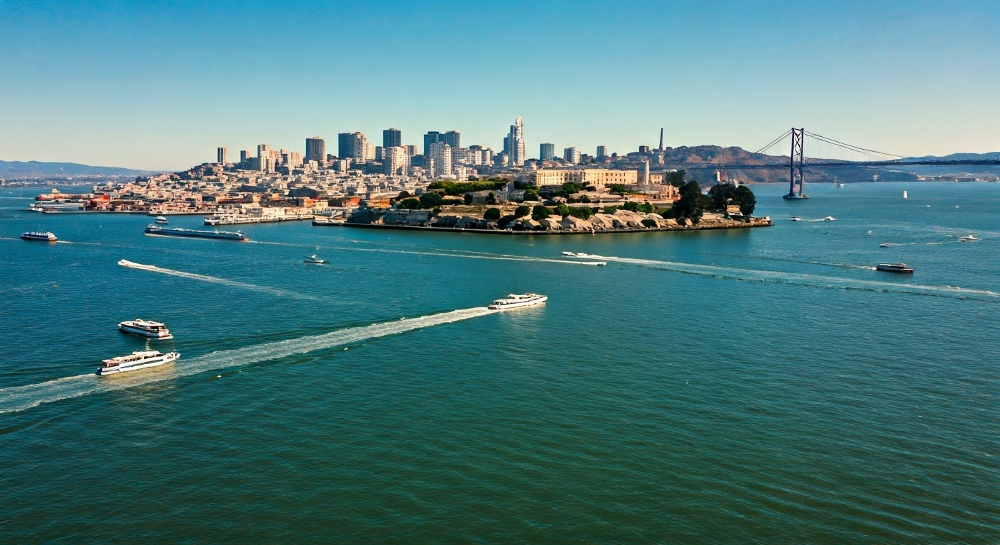

In [69]:
import base64
from PIL import Image
from io import BytesIO

# Read the base64 encoded image from the file
with open('base64_image.jpeg', 'r') as f:
    base64_string = f.read()

# Decode the base64 string into image bytes
image_bytes = base64.b64decode(base64_string)

# Open the image using Pillow library
image = Image.open(BytesIO(image_bytes))

# Display the image
display(image)

### Generate a video from the image

In [70]:
%%bash

# Prepare the JSON request for generating a video from an image using the Veo API.
# It reads the base64 encoded image from 'base64_image.jpeg' and embeds it into the request.

# Store the base64 image data from the file into a variable.
base64_image=$(cat base64_image.jpeg)
cat <<EOF > request.json
{
  "instances": [
    {
      "prompt": "An aerial view from a drone, flying over San Francisco during a boat race.",
      "image": {
        "bytesBase64Encoded": "$base64_image",
        "mimeType": "image/jpeg"
      }
    }
  ],
    "parameters": {
      "aspectRatio": "16:9",
      "negativePrompt": "cars",
      "personGeneration": "allow_adult",
      "sampleCount": 1,
      "durationSeconds": 8
    }
}
EOF

if [[ -e "I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab" ]]; then

  # Send the video generation request to the Veo API and extracts the
  # operation name from the response, which is used to track the operation's progress.

  curl "https://generativelanguage.googleapis.com/v1beta/models/veo-2.0-generate-001:predictLongRunning?key=${GOOGLE_API_KEY}" \
    -H "Content-Type: application/json" \
    -X "POST" \
    -d @request.json \
    | tee result.json | jq .name | sed 's/"//g' > op_name

  # Remove the request json file as it is no longer needed
  rm request.json

  # Notify the user that the video generation has been initiated.
  echo "Video generation initiated."

  # Output the content of result.json to the console
  cat result.json

else
  echo "Veo is a paid feature. Please change the variable 'I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab' to True if you are okay with paying to run it."
fi

Video generation initiated.
{
  "name": "models/veo-2.0-generate-001/operations/nfgpeg6ixrh2"
}


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1746k    0    68  100 1746k     60  1553k  0:00:01  0:00:01 --:--:-- 1554k


### Wait for generation to finish

In [71]:
%%bash

# Retrieve the operation name from the 'op_name' file.
op_name=$(cat op_name)

# Initialize the status variable to 'null'.
STATUS="null"

# Loop until the status is no longer 'null', indicating the operation is complete.
while [[ $STATUS == "null" ]]
do
  # Wait for 5 seconds before polling the API again.
  sleep 5

  # Store the entire response in a temporary file
  curl "https://generativelanguage.googleapis.com/v1beta/${op_name}?key=${GOOGLE_API_KEY}" \
    -H "Content-Type: application/json" \
    -X "GET" > temp_response.json

  # Extract the response field to response.json using jq
  jq '.response' temp_response.json > response.json

  # Read the status from the 'response.json' file using jq with the -r flag for raw output.
  STATUS=$(jq -r '.' response.json)

  # Print the current status for debugging purposes.
  echo "Current status: $STATUS"
done

Current status: null
Current status: null
Current status: null
Current status: null
Current status: null
Current status: {
  "@type": "type.googleapis.com/google.ai.generativelanguage.v1beta.PredictLongRunningResponse",
  "generateVideoResponse": {
    "generatedSamples": [
      {
        "video": {
          "uri": "https://generativelanguage.googleapis.com/v1beta/files/ih2z2fgra1yy:download?alt=media"
        }
      }
    ]
  }
}


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0    132      0 --:--:-- --:--:-- --:--:--   132
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0    196      0 --:--:-- --:--:-- --:--:--   197
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0    145      0 --:--:-- --:--:-- --:--:--   144
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    68    0    68    0     0    142      0 --:--:-- --:--:-- --:--:--   142
  % Total    % Received % Xferd  Average Speed   Tim

### Download the generated video

In [72]:
%%bash

# Pretty print the response json for readability (Optional)
jq '' -r response.json

# Extract the video URIs from the response and save them to uris.txt
jq '.generateVideoResponse.generatedSamples[].video.uri' -r response.json | tee uris.txt

# Download the generated videos

idx=0

while read uri; do
  # Use curl to download each video
  # --location -> follow redirects
  curl "${uri}&key=${GOOGLE_API_KEY}" \
    --location \
    -H "Content-Type: video/mp4" \
    -0 > video_${idx}.mp4 # Save each video to a separate file

  idx=$((idx+1))
done < uris.txt # Read URIs from the uris.txt file

ls video_*

{
  "@type": "type.googleapis.com/google.ai.generativelanguage.v1beta.PredictLongRunningResponse",
  "generateVideoResponse": {
    "generatedSamples": [
      {
        "video": {
          "uri": "https://generativelanguage.googleapis.com/v1beta/files/ih2z2fgra1yy:download?alt=media"
        }
      }
    ]
  }
}
https://generativelanguage.googleapis.com/v1beta/files/ih2z2fgra1yy:download?alt=media
video_0.mp4


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 4952k  100 4952k    0     0  6888k      0 --:--:-- --:--:-- --:--:-- 6888k


### Check the generated video (optional - Python)

In [73]:
import pathlib
from IPython.display import display, Video

# Show the downloaded videos
for fpath in pathlib.Path('.').glob("video_*.mp4"):
  display(Video(str(fpath), embed=True))

## Make sure you're not runnning the colab by mistake

In [33]:
%%bash

rm -f I_am_aware_that_veo_is_a_paid_feature_and_am_OK_with_paying_to_run_this_colab

## Next Steps
### Useful API references:

Check the [Veo documentation](https://ai.google.dev/gemini-api/docs/video) and the [prompt guide](https://ai.google.dev/gemini-api/docs/video/veo-prompt-guide) for more details on how to use Veo and best prompt it.

### Related examples

The [Book illustration](../examples/Book_illustration.ipynb) is a nice example on how to mix Gemini long context window with Imagen and Veo asset generation to illustrated a book.

### Continue your discovery of the Gemini API

Here are other cool Gemini features that you might find interesting:
* [Imagen](./Get_started_Imagen.ipynb) can generate images with fine detail, rich lighting, and few distracting artifact from natural language prompts;
* Gemini's [Image-out](./Image-out.ipynb) native image output can also generate images and let you iterate on them by chatting with the model;
* Native [Audio-out](./Audio-out.ipynb) is also a great multimodal output capability that's quite fun to play with.